***This notebook has embedded audio, which GitHub does not render, so use [nbviewer](http://nbviewer.jupyter.org/) to view this notebook instead.***

# How to "banjo-ify" a song

## Example: Before ...

A12 G2 =F2 D12 =F2 D2 G12 =F2 G2 A12 G2 =F2 D16


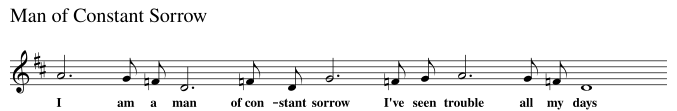

In [1]:
from banjo import *

play(song, title='Man of Constant Sorrow', lyrics=lyrics)

AdgAdgAdgAdg Gd =Fd DdgDdgDdgDdg =Fd Dd GdgGdgGdgGdg =Fd Gd AdgAdgAdgAdg Gd =Fd DdgDdgDdgDdgDdgd


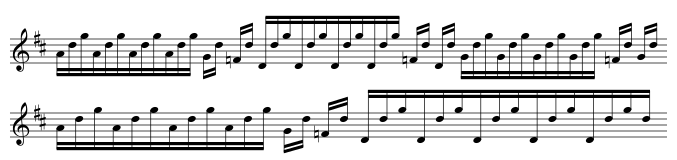

In [2]:
play(banjoify(rules, song))

# Recreate `banjoify` function & `rules` from scratch

# Use open source
- Command line utilities
  - `abcm2ps` (**ABC → SVG** sheet music)
  - `abc2midi` (**ABC → MIDI** music)
  - `fluidsynth` (**MIDI → WAV** audio)
- **Jupyter** Notebook

# Let's program a banjo grammar!

In [3]:
from nltk import CFG
from nltk.parse.generate import generate

# Start with one note

AAAAAAAAAAAA


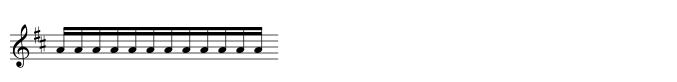

In [4]:
rules = """

    A12 -> 'AAAAAAAAAAAA'

"""

def banjoify(rules):
    grammar = CFG.fromstring(rules)
    phrase = next(generate(grammar))
    return ''.join(phrase)

play(banjoify(rules))

# Add variation

AdAdAdAdAdAd


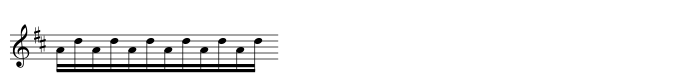

In [5]:
rules = """

    A12 -> 'AdAdAdAdAdAd'

"""

play(banjoify(rules))

# Refactor the rules

AdAdAdAdAdAd


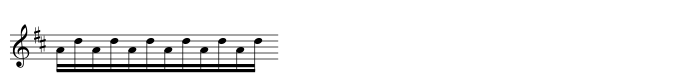

In [6]:
rules = """
    A12 -> 'AdAdAdAdAdAd'
"""

rules = """
     12 -> 2 2 2 2 2 2
      2 -> melody string1
string1 -> 'd'
 melody -> 'A'
"""

play(banjoify(rules))

# Drones

V:1
%%MIDI program 109
z8 A12 G2 =F2 D12
V:2
%%MIDI program 109
D,48


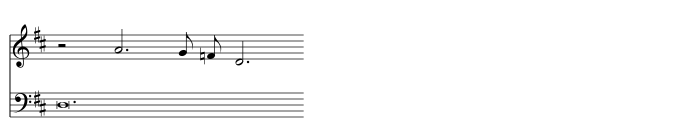

In [7]:
play(bagpipes)

# First four notes

In [8]:
first_four = 'A12 G2 =F2 D12'
parse_abc(first_four)

[('A', '12'), ('G', '2'), ('=F', '2'), ('D', '12')]

AdAdAdAdAdAd AdAdAdAdAdAd AdAdAdAdAdAd AdAdAdAdAdAd


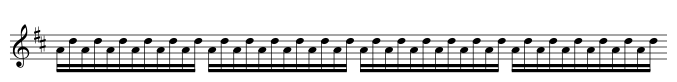

In [9]:
def banjoify(rules, song):
    arrangement = []
    for note in parse_abc(song):
        grammar = CFG.fromstring(rules)
        phrase = next(generate(grammar))
        arrangement.append(''.join(phrase))
    return ' '.join(arrangement)

play(banjoify(rules, first_four))

# Apply pitches

In [10]:
rules = """
     12 -> 2 2 2 2 2 2
      2 -> melody string1
string1 -> 'd'
 melody -> '{pitch}'
"""

print(rules.format(pitch='A'))


     12 -> 2 2 2 2 2 2
      2 -> melody string1
string1 -> 'd'
 melody -> 'A'



AdAdAdAdAdAd GdGdGdGdGdGd =Fd=Fd=Fd=Fd=Fd=Fd DdDdDdDdDdDd


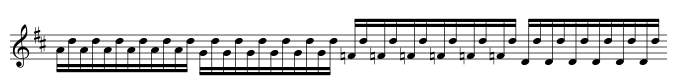

In [11]:
def banjoify(rules, song):
    arrangement = []
    for pitch, duration in parse_abc(song):
        grammar = CFG.fromstring(
            rules.format(pitch=pitch))
        phrase = next(generate(grammar))
        arrangement.append(''.join(phrase))
    return ' '.join(arrangement)

play(banjoify(rules, first_four))

# Apply durations

AdAdAdAdAdAd Gd =Fd DdDdDdDdDdDd


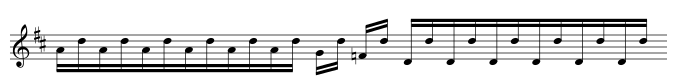

In [12]:
from nltk import Nonterminal

def banjoify(rules, song):
    arrangement = []
    for pitch, duration in parse_abc(song):
        grammar = CFG.fromstring(
            rules.format(pitch=pitch))
        phrase = next(generate(grammar, 
            start=Nonterminal(duration)))
        arrangement.append(''.join(phrase))
    return ' '.join(arrangement)

play(banjoify(rules, first_four))

# More rhythms

AdgAdgAdgAdg Gd =Fd DdgDdgDdgDdg


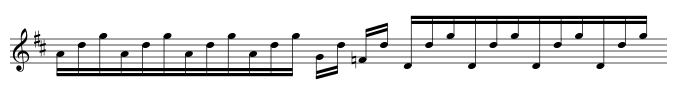

In [13]:
rules = """
     12 -> 3 3 3 3
      3 -> melody string1 string5
      2 -> melody string1
string1 -> 'd'
string5 -> 'g'
 melody -> '{pitch}'
"""

play(banjoify(rules, first_four))

# Whole song

AdgAdgAdgAdg Gd =Fd DdgDdgDdgDdg =Fd Dd GdgGdgGdgGdg =Fd Gd AdgAdgAdgAdg Gd =Fd DdgDdgDdgDdgDdgd


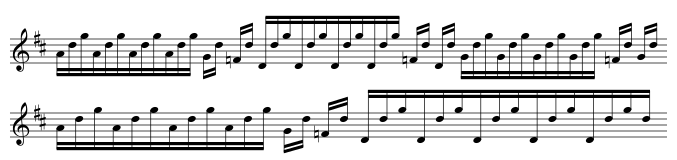

In [14]:
rules = """
     16 -> 3 3 3 3 4
     12 -> 3 3 3 3
      4 -> melody string1 string5 string1
      3 -> melody string1 string5
      2 -> melody string1
string1 -> 'd'
string5 -> 'g'
 melody -> '{pitch}'
"""

play(banjoify(rules, song))

# More songs

In [15]:
# Happy Birthday
hbd

'D2 D2 E4 D4 G4 F8 D2 D2 E4 D4 A4 G8 D2 D2 d4 B4 G4 F4 E4 c2 c2 B4 G4 A4 G8'

Dd Dd Edgd Ddgd Gdgd FdgFdgFd Dd Dd Edgd Ddgd Adgd GdgGdgGd Dd Dd ddgd Bdgd Gdgd Fdgd Edgd cd cd Bdgd Gdgd Adgd GdgGdgGd


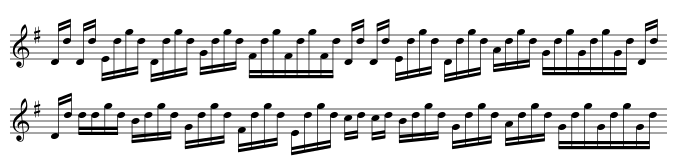

In [16]:
rules = """
     16 -> 3 3 3 3 4
     12 -> 3 3 3 3
      8 -> 3 3 2
      4 -> melody string1 string5 string1
      3 -> melody string1 string5
      2 -> melody string1
string1 -> 'd'
string5 -> 'g'
 melody -> '{pitch}'
"""

play(banjoify(rules, hbd), key='G')

# More possibilities

In [17]:
rules = """
     16 -> 3 3 3 3 4
     12 -> 3 3 3 3
      8 -> 3 3 2
      4 -> melody string1 string5 string1
      4 -> melody '2'     string5 string1
      4 -> melody '2 ['string5 string1']2'
      3 -> melody string1 string5
      2 -> melody string1
      2 -> melody '2'
string1 -> 'd'
string5 -> 'g'
 melody -> '{pitch}'
"""

grammar = CFG.fromstring(
    rules.format(pitch='A'))
phrase = next(generate(grammar))
''.join(phrase)

'AdgAdgAdgAdgAdgd'

In [18]:
options = list(generate(grammar))
[''.join(phrase) for phrase in options]

['AdgAdgAdgAdgAdgd', 'AdgAdgAdgAdgA2gd', 'AdgAdgAdgAdgA2 [gd]2']

In [20]:
import random
phrase = random.choice(options)
''.join(phrase)

'AdgAdgAdgAdgA2 [gd]2'

9,795,520,512 possibilities 

Dd Dd E2 [gd]2 D2 [gd]2 G2gd FdgFdgFd Dd D2 Edgd D2 [gd]2 Adgd GdgGdgGd Dd Dd d2 [gd]2 Bdgd G2gd F2gd E2gd c2 c2 B2 [gd]2 Gdgd A2 [gd]2 GdgGdgGd


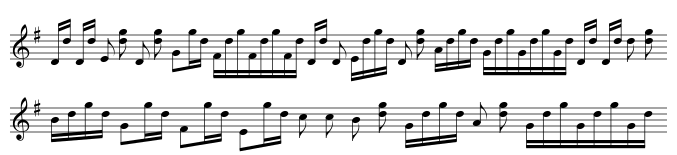

In [21]:
def banjoify(rules, song):
    arrangement = []
    n_possible = 1
    for pitch, duration in parse_abc(song):
        grammar = CFG.fromstring(
            rules.format(pitch=pitch))
        options = list(generate(grammar, 
            start=Nonterminal(duration)))
        n_possible *= len(options)
        phrase = random.choice(options)
        arrangement.append(''.join(phrase))
    print('{:,}'.format(n_possible), 
          'possibilities \n')
    return ' '.join(arrangement)

play(banjoify(rules, hbd), key='G')

In [22]:
2.5 ** 25

8881784197.001253

13,217,562,624 possibilities 

A2gdAdgdAdgd G2 =Fd DdgdD2 [gd]2Ddgd =F2 D2 G2 [gd]2G2gdG2 [gd]2 =F2 G2 AdgdA2 [gd]2A2 [gd]2 G2 =F2 D2 [gd]2D2 [gd]2D2gdDdgd


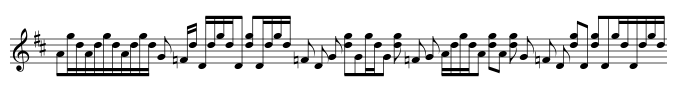

In [23]:
rules = """
     16 -> 3 3 3 3 4
     16 -> 4 4 4 4
     12 -> 3 3 3 3
     12 -> 4 4 4
      8 -> 3 3 2
      4 -> melody string1 string5 string1
      4 -> melody '2'     string5 string1
      4 -> melody '2 ['string5 string1']2'
      3 -> melody string1 string5
      2 -> melody string1
      2 -> melody '2'
string1 -> 'd'
string5 -> 'g'
 melody -> '{pitch}'
"""

play(banjoify(rules, song))